In [1]:
import numpy as np
import os
import torch.nn as nn
import torch.optim as optim
import torch as T
from torch.distributions.categorical import Categorical

In [2]:
class PPOMemory:
    def __init__(self, batch_size):
        self.states = []
        self.probs = []
        self.vals = []
        self.actions = []
        self.rewards = []

        self.batch_size = batch_size

    def generate_batches(self):
        n_states = len(self.states)
        batch_start = np.arange(0, n_states, self.batch_size)
        indices = np.arange(n_states, dtype=np.int64)
        np.random.shuffle(indices)
        batches = [indices[i:i+self.batch_size] for i in batch_start]

        return np.array(self.states),\
                np.array(self.actions),\
                np.array(self.probs),\
                np.array(self.vals),\
                np.array(self.rewards),\
                batches

    def store_memory(self, state, action, probs, vals, reward):
        self.states.append(state)
        self.actions.append(action)
        self.probs.append(probs)
        self.vals.append(vals)
        self.rewards.append(reward)

    def clear_memory(self):
        self.states = []
        self.probs = []
        self.actions = []
        self.rewards = []
        self.vals = []

In [6]:
class ActorNetwork(nn.Module):
    def __init__(self, n_actions, input_dims, alpha,
            fc1_dims=256, fc2_dims=256, chkpt_dir='tmp/ppo'):
        super(ActorNetwork, self).__init__()

        self.checkpoint_file = os.path.join(chkpt_dir, 'actor_torch_ppo')
        self.actor = nn.Sequential(
                nn.Linear(*input_dims, fc1_dims),
                nn.ReLU(),
                nn.Linear(fc1_dims, fc2_dims),
                nn.ReLU(),
                nn.Linear(fc2_dims, n_actions),
                nn.Softmax(dim=-1)
        )

        self.optimizer = optim.Adam(self.parameters(), lr=alpha)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        dist = self.actor(state)
        dist = Categorical(dist)
        
        return dist

    def save_checkpoint(self):
        T.save(self.state_dict(), self.checkpoint_file)

    def load_checkpoint(self):
        self.load_state_dict(T.load(self.checkpoint_file))

class CriticNetwork(nn.Module):
    def __init__(self, input_dims, alpha, fc1_dims=256, fc2_dims=256,
            chkpt_dir='tmp/ppo'):
        super(CriticNetwork, self).__init__()

        self.checkpoint_file = os.path.join(chkpt_dir, 'critic_torch_ppo')
        self.critic = nn.Sequential(
                nn.Linear(*input_dims, fc1_dims),
                nn.ReLU(),
                nn.Linear(fc1_dims, fc2_dims),
                nn.ReLU(),
                nn.Linear(fc2_dims, 1)
        )

        self.optimizer = optim.Adam(self.parameters(), lr=alpha)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        value = self.critic(state)

        return value

    def save_checkpoint(self):
        T.save(self.state_dict(), self.checkpoint_file)

    def load_checkpoint(self):
        self.load_state_dict(T.load(self.checkpoint_file))

In [8]:
class Agent:
    def __init__(self, n_actions, input_dims, gamma=0.99, alpha=0.0003, gae_lambda=0.95,
            policy_clip=0.2, batch_size=25, n_epochs=10): # batch_size=5, n_epochs=4
        self.gamma = gamma
        self.policy_clip = policy_clip
        self.n_epochs = n_epochs
        self.gae_lambda = gae_lambda

        self.actor = ActorNetwork(n_actions, input_dims, alpha)
        self.critic = CriticNetwork(input_dims, alpha)
        self.memory = PPOMemory(batch_size)
       
    def remember(self, state, action, probs, vals, reward):
        self.memory.store_memory(state, action, probs, vals, reward)

    def save_models(self):
        print('... saving models ...')
        self.actor.save_checkpoint()
        self.critic.save_checkpoint()

    def load_models(self):
        print('... loading models ...')
        self.actor.load_checkpoint()
        self.critic.load_checkpoint()

    def choose_action(self, observation):
        state = T.tensor([observation], dtype=T.float).to(self.actor.device)

        dist = self.actor(state)
        value = self.critic(state)
        action = dist.sample()

        probs = T.squeeze(dist.log_prob(action)).item()
        action = T.squeeze(action).item()
        value = T.squeeze(value).item()
        T_chws_set.value = action+6

        return action, probs, value

    def learn(self):
        for _ in range(self.n_epochs):
            state_arr, action_arr, old_prob_arr, vals_arr,\
            reward_arr, batches = \
                    self.memory.generate_batches()

            values = vals_arr
            advantage = np.zeros(len(reward_arr), dtype=np.float32)

            for t in range(len(reward_arr)-1):
                discount = 1
                a_t = 0
                for k in range(t, len(reward_arr)-1):
                    a_t += discount*(reward_arr[k] + self.gamma*values[k+1]*\
                             - values[k])
                    discount *= self.gamma*self.gae_lambda
                advantage[t] = a_t

            advantage = T.tensor(advantage).to(self.actor.device)

            values = T.tensor(values).to(self.actor.device)
            
            for batch in batches:
                states = T.tensor(state_arr[batch], dtype=T.float).to(self.actor.device)
                old_probs = T.tensor(old_prob_arr[batch]).to(self.actor.device)
                actions = T.tensor(action_arr[batch]).to(self.actor.device)

                dist = self.actor(states)
                critic_value = self.critic(states)

                critic_value = T.squeeze(critic_value)

                new_probs = dist.log_prob(actions)
                prob_ratio = new_probs.exp() / old_probs.exp()
                #prob_ratio = (new_probs - old_probs).exp()
                weighted_probs = advantage[batch] * prob_ratio
                weighted_clipped_probs = T.clamp(prob_ratio, 1-self.policy_clip,
                        1+self.policy_clip)*advantage[batch]
                actor_loss = -T.min(weighted_probs, weighted_clipped_probs).mean()

                returns = advantage[batch] + values[batch]
                critic_loss = (returns-critic_value)**2
                critic_loss = critic_loss.mean()

                total_loss = actor_loss + 0.5*critic_loss


                self.actor.optimizer.zero_grad()
                self.critic.optimizer.zero_grad()
                total_loss.backward()
                self.actor.optimizer.step()
                self.critic.optimizer.step()

        self.memory.clear_memory()   

Initialization of Arrays

In [10]:
score_history = []
eps_history = []
power_history = []
setpoints_history = []
n_episodes = 50


for i in range(n_episodes):
    empty_array1 = []
    power_history.append(empty_array1)
    empty_array2 = []
    setpoints_history.append(empty_array2)

keys = ['CHILLER', 'CHILLER 1', 'CHILLER 2']

In [11]:
import pandas as pd

# Load the Excel file containing predictions
predictions_df = pd.read_excel('PowerPredictions.xlsx')

# Define a function to get the prediction for a given step
def get_prediction(step, chiller):
    return predictions_df.loc[step - 1, f'Prediction_RF_{chiller} (Power{chiller}+1)']


50 Episodes

In [12]:
import energyplus.ooep as ooep
import energyplus.ooep.ems
import energyplus.ooep.addons.state
import numpy as np


agent = Agent( n_actions=10 , input_dims=(13,))
N=100

for episode in range(n_episodes):  
    env = energyplus.ooep.ems.Environment().__enter__()

    P_ch = [env.variable(dict(
            variable_name='Chiller Electricity Rate',
            variable_key=key)) for key in keys]
    T_outdoor = env.variable(dict(
            variable_name='Site Outdoor Air Drybulb Temperature',
            variable_key='ENVIRONMENT'))
    T_chws = [env.variable(dict(
            variable_name='Chiller Evaporator Outlet Temperature', 
            variable_key=key)) for key in keys]
    T_chwr = [env.variable(dict(
            variable_name='Chiller Evaporator Inlet Temperature', 
            variable_key=key)) for key in keys]
    T_chws_set = env.actuator(dict(
            component_type='System Node Setpoint',
            control_type = 'Temperature Setpoint', 
            actuator_key='CHW Loop Supply Side Outlet'))

    sm_env = ooep.addons.state.StateMachine(env)
    sm_stepf = sm_env.step_function(
        dict(event_name='begin_zone_timestep_after_init_heat_balance')
    )

    sm_env.run(
        '--output-directory', 'build3/demo-eplus',
        '--weather', f'./SGP_Singapore_486980_IWEC.epw',
        f'./jan4.idf',
        verbose=True,
    )

    # This is to wait until the ooep environment is ready
    while True:

        sm_stepf()


        try:

            P_ch = [env.variable(dict(
                        variable_name='Chiller Electricity Rate',
                        variable_key=key)) for key in keys]
            power = P_ch[0].value + P_ch[1].value + P_ch[2].value

            print(power)
            break

        except ooep.ems.NotReadyError: pass


    score = 0

    for step in range(1, 7624):
        
        
        obs = []
        power_sum = 0

        # Add Chiller Electricity values to the observation space
        for chiller_electricity_rate in P_ch:
            obs.append(chiller_electricity_rate.value)
            power_sum += chiller_electricity_rate.value
        
        obs.append(T_outdoor.value)

        for chiller_evaporator_outlet_temp in T_chws:
            obs.append(chiller_evaporator_outlet_temp.value)

        for chiller_evaporator_inlet_temp in T_chwr:
            obs.append(chiller_evaporator_inlet_temp.value)

        # Add predictions for each chiller to the observation space
        for chiller in range(1, 4):
            obs.append(get_prediction(step, chiller))

        
        if power_sum != 0:
            reward = 120000/ (power_sum)
        else:
            reward = 0

        #Second type of reward function
        '''
        K1 = 0.8
        K2 = 0.2
        S1 = 0.5
        S2 = 0.14
        T_chwr_ref = 17
        P_ref = 120000

        reward = K1*(1 - (power_sum/P_ref)) + K2*(1/(1 + S1*np.exp(S2*(T_chwr[0].value - T_chwr_ref)) ))
        '''
        score += reward

        action, prob, val  = agent.choose_action(obs)
        sm_stepf()

        agent.remember(obs, action, prob, val, reward)


        if step%N ==0:
            agent.learn()

        setpoints_history[episode].append(action + 6)
        power_history[episode].append(power_sum)

    score_history.append(score)
    avg_score = np.mean(score_history[-100:])
    print(f'episode {episode+1}, score {score}, average score {avg_score}', flush=True, file=__import__('sys').stderr)


0.0


episode 1, score 6151.38527697768, average score 6151.38527697768


0.0


episode 2, score 6038.937972546102, average score 6095.161624761891


0.0


episode 3, score 8638.214596531207, average score 6942.845948684997


0.0


episode 4, score 5767.831234220469, average score 6649.092270068865


0.0


episode 5, score 6139.527717315569, average score 6547.179359518206


0.0


episode 6, score 5757.171758356996, average score 6415.511425991338


0.0


episode 7, score 5760.914573591742, average score 6321.997589934253


0.0


episode 8, score 5763.568870908797, average score 6252.19400005607


0.0


episode 9, score 5751.005706848032, average score 6196.506411921843


0.0


episode 10, score 6203.322997282613, average score 6197.188070457921


0.0


episode 11, score 6141.500636645903, average score 6192.125576475009


0.0


episode 12, score 6186.3324424143875, average score 6191.642815303291


0.0


episode 13, score 6189.614333635067, average score 6191.4867782518895


0.0


episode 14, score 6242.616936072196, average score 6195.138932381911


0.0


episode 15, score 6230.699852281329, average score 6197.509660375205


0.0


episode 16, score 6253.385423283001, average score 6201.001895556943


0.0


episode 17, score 6207.577748370481, average score 6201.388710428328


0.0


episode 18, score 5847.022748123808, average score 6181.701712522521


0.0


episode 19, score 5753.093793493651, average score 6159.143400994685


0.0


episode 20, score 5761.416320155328, average score 6139.257046952718


0.0


episode 21, score 5762.801658500772, average score 6121.330599883578


0.0


episode 22, score 5755.388813191263, average score 6104.696882306654


0.0


episode 23, score 5760.920800381429, average score 6089.750096135992


0.0


episode 24, score 5759.100827292434, average score 6075.973043267511


0.0


episode 25, score 5763.052046278885, average score 6063.4562033879665


0.0


episode 26, score 5757.513420667711, average score 6051.689173283341


0.0


episode 27, score 6177.365073374173, average score 6056.343836249668


0.0


episode 28, score 6238.539501411288, average score 6062.850824291155


0.0


episode 29, score 6229.609461652426, average score 6068.601122131199


0.0


episode 30, score 6168.678049125702, average score 6071.937019697682


0.0


episode 31, score 6236.66215591243, average score 6077.250733769126


0.0


episode 32, score 6254.480516535992, average score 6082.7891644805895


0.0


episode 33, score 6150.254868831899, average score 6084.833579763962


0.0


episode 34, score 5749.802727280468, average score 6074.979731161507


0.0


episode 35, score 5744.924328492698, average score 6065.549576799541


0.0


episode 36, score 5745.646947876855, average score 6056.663392662799


0.0


episode 37, score 5744.790835439671, average score 6048.234404629741


0.0


episode 38, score 5745.6535638591085, average score 6040.271750925252


0.0


episode 39, score 5745.789941888193, average score 6032.7209353089165


0.0


episode 40, score 5746.102745697392, average score 6025.555480568629


0.0


episode 41, score 5744.26116332594, average score 6018.69464356271


0.0


episode 42, score 5743.756527381117, average score 6012.148497939338


0.0


episode 43, score 5745.95363238075, average score 6005.9579196705345


0.0


episode 44, score 5746.31214572958, average score 6000.056879353695


0.0


episode 45, score 5751.426162455567, average score 5994.5317523115145


0.0


episode 46, score 5745.71205525219, average score 5989.122628462398


0.0


episode 47, score 5746.410241533675, average score 5983.958535123489


0.0


episode 48, score 5767.811314881703, average score 5979.455468035118


In [1]:
import numpy as np
import matplotlib.pyplot as plt

mean_power_history = []

for episode in range(n_episodes):
    mean_power_history.append(np.mean(power_history[episode]))
    

plt.plot(mean_power_history)
plt.xlabel('Episode')
plt.ylabel('Mean Power')
plt.title('Mean Power per Episode')
plt.show()

plt.plot(score_history)
plt.xlabel('Episode')
plt.ylabel('Score')
plt.title('Score per Episode')
plt.show()




NameError: name 'n_episodes' is not defined

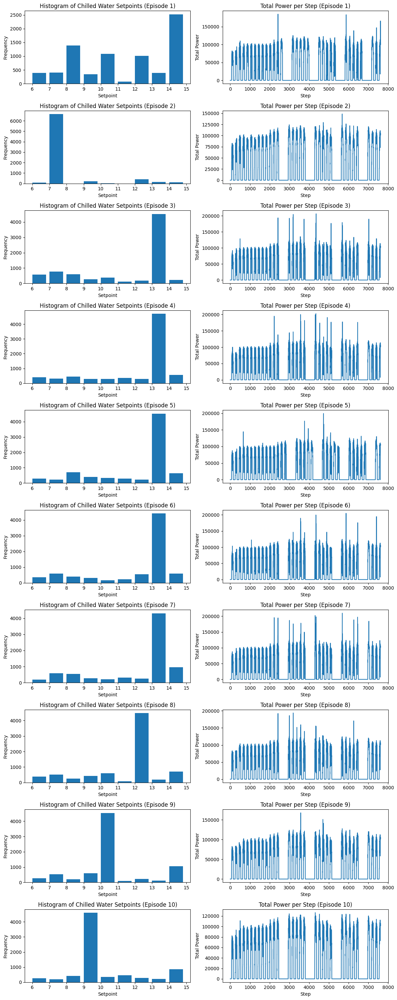

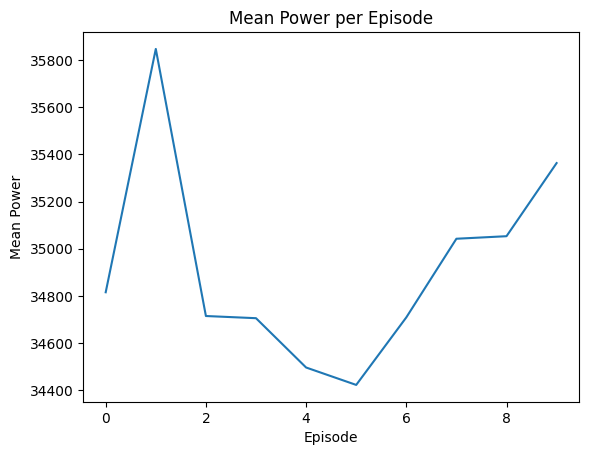

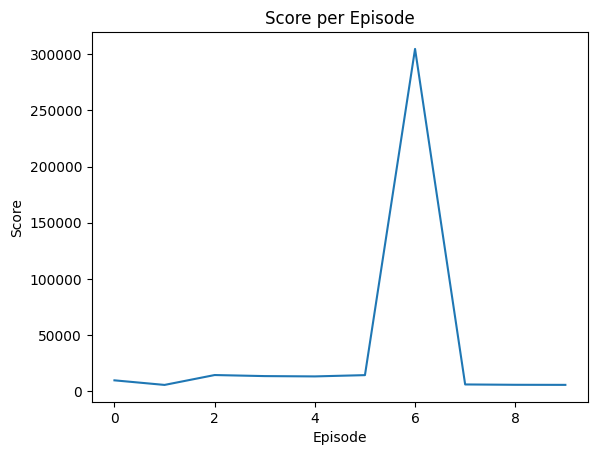

In [15]:
import numpy as np
import matplotlib.pyplot as plt



# Create a figure for the collage of plots
fig, axs = plt.subplots(n_episodes, 2, figsize=(12, 3*n_episodes))

# Loop over each episode
for episode in range(n_episodes):
    # Plot the histogram of setpoints
    counts, bins = np.histogram(setpoints_history[episode], bins=np.arange(6, 16))
    axs[episode, 0].bar(bins[:-1], counts, width=0.8, align='edge')
    axs[episode, 0].set_xlabel('Setpoint')
    axs[episode, 0].set_ylabel('Frequency')
    axs[episode, 0].set_title(f'Histogram of Chilled Water Setpoints (Episode {episode+1})')
    axs[episode, 0].set_xticks(np.arange(6, 16))
    
    # Plot the total power history
    axs[episode, 1].plot(power_history[episode])
    axs[episode, 1].set_xlabel('Step')
    axs[episode, 1].set_ylabel('Total Power')
    axs[episode, 1].set_title(f'Total Power per Step (Episode {episode+1})')

# Adjust layout
plt.tight_layout()

# Display the collage of plots
plt.show()

# Plot mean power history
plt.plot(mean_power_history)
plt.xlabel('Episode')
plt.ylabel('Mean Power')
plt.title('Mean Power per Episode')
plt.show()

# Plot score history
plt.plot(score_history)
plt.xlabel('Episode')
plt.ylabel('Score')
plt.title('Score per Episode')
plt.show()


Without PPO controller
Just to see the impact of controller on power

In [2]:
import energyplus.ooep as ooep
import energyplus.ooep.ems
import energyplus.ooep.addons.state
import numpy as np


#agent = Agent( n_actions=10 , batch_size = 5, n_epochs = 5, input_dims=(13,))

for episode in range(5):  
    env = energyplus.ooep.ems.Environment().__enter__()

    P_ch = [env.variable(dict(
            variable_name='Chiller Electricity Rate',
            variable_key=key)) for key in keys]
    T_outdoor = env.variable(dict(
            variable_name='Site Outdoor Air Drybulb Temperature',
            variable_key='ENVIRONMENT'))
    T_chws = [env.variable(dict(
            variable_name='Chiller Evaporator Outlet Temperature', 
            variable_key=key)) for key in keys]
    T_chwr = [env.variable(dict(
            variable_name='Chiller Evaporator Inlet Temperature', 
            variable_key=key)) for key in keys]
    T_chws_set = env.actuator(dict(
            component_type='System Node Setpoint',
            control_type = 'Temperature Setpoint', 
            actuator_key='CHW Loop Supply Side Outlet'))

    sm_env = ooep.addons.state.StateMachine(env)
    sm_stepf = sm_env.step_function(
        dict(event_name='begin_zone_timestep_after_init_heat_balance')
    )

    sm_env.run(
        '--output-directory', 'build3/demo-eplus',
        '--weather', f'./SGP_Singapore_486980_IWEC.epw',
        f'./jan4.idf',
        verbose=True,
    )

    while True:

        sm_stepf()


        try:

            P_ch = [env.variable(dict(
                        variable_name='Chiller Electricity Rate',
                        variable_key=key)) for key in keys]
            power = P_ch[0].value + P_ch[1].value + P_ch[2].value

            print(power)
            break

        except ooep.ems.NotReadyError: pass


    score = 0

    for step in range(1, 7624):
        
        
        obs = []
        power_sum = 0

        # Add Chiller Electricity values to the observation space
        for chiller_electricity_rate in P_ch:
            obs.append(chiller_electricity_rate.value)
            power_sum += chiller_electricity_rate.value
        
        obs.append(T_outdoor.value)

        for chiller_evaporator_outlet_temp in T_chws:
            obs.append(chiller_evaporator_outlet_temp.value)

        for chiller_evaporator_inlet_temp in T_chwr:
            obs.append(chiller_evaporator_inlet_temp.value)


        
        #if power_sum != 0:
            #reward = 120000/ (power_sum)
        #else:
            #reward = 0

        K1 = 0.6
        K2 = 0.4
        S1 = 0.5
        S2 = 0.14
        T_chwr_ref = 17
        P_ref = 120000

        reward = K1*(1 - (power_sum/P_ref)) + K2*(1/(1 + S1*np.exp(S2*(T_chwr[0].value - T_chwr_ref))))

        score += reward

        #action, prob, val  = agent.choose_action(obs)
        sm_stepf()

        #agent.remember(obs, action, prob, val, reward)
        #agent.learn()

        print(rf"Episode={episode+1} Step={step}  P_ch={P_ch[0].value,P_ch[1].value,P_ch[2].value}) Reward={reward} (T_outdoor={T_outdoor.value}) (T_chwr1={T_chwr[0].value}) (T_chwr2={T_chwr[1].value}) (T_chwr3={T_chwr[2].value})(T_chws1={T_chws[0].value}) (T_chws2={T_chws[1].value}) (T_chws3={T_chws[2].value}) ", flush=True, file=__import__('sys').stderr)

        setpoints_history[episode].append( 6)
        power_history[episode].append(power_sum)

    score_history.append(score)

Episode=1 Step=1  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=25.000000000000004) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=2  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.9) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=3  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.9) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=4  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.799999999999997) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=5  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.799999999999997) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=6  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.7) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0

0.0


Episode=1 Step=56  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.224999999999998) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=57  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.224999999999998) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=1 Step=58  P_ch=(570.297047656866, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.25) (T_chwr1=7.0775460308133695) (T_chwr2=7.0775460308133695) (T_chwr3=7.0775460308133695)(T_chws1=6.0) (T_chws2=7.0775460308133695) (T_chws3=7.0775460308133695) 
Episode=1 Step=59  P_ch=(570.297047656866, 0.0, 0.0)) Reward=0.9528165064327194 (T_outdoor=24.25) (T_chwr1=7.0775460308133695) (T_chwr2=7.0775460308133695) (T_chwr3=7.0775460308133695)(T_chws1=6.0) (T_chws2=7.0775460308133695) (T_chws3=7.0775460308133695) 
Episode=1 Step=60  P_ch=(1001.9932074963708, 0.0, 0.0)) Reward=0.9528165064327194 (T_outdoor=24.275000000000002) (T_chwr1=

0.0



Episode=2 Step=39  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=2 Step=40  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.075000000000003) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=2 Step=41  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.075000000000003) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=2 Step=42  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.05) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=2 Step=43  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.05) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=2 Step=44  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.025) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T

0.0


Episode=3 Step=32  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=3 Step=33  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=3 Step=34  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=3 Step=35  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=3 Step=36  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=3 Step=37  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws

0.0


Episode=4 Step=31  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=4 Step=32  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=4 Step=33  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=4 Step=34  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=4 Step=35  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=4 Step=36  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws

0.0


Episode=5 Step=29  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.125000000000004) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=5 Step=30  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=5 Step=31  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=5 Step=32  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=5 Step=33  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws2=6.0) (T_chws3=6.0) 
Episode=5 Step=34  P_ch=(0.0, 0.0, 0.0)) Reward=0.9612747595635046 (T_outdoor=24.1) (T_chwr1=6.0) (T_chwr2=6.0) (T_chwr3=6.0)(T_chws1=6.0) (T_chws

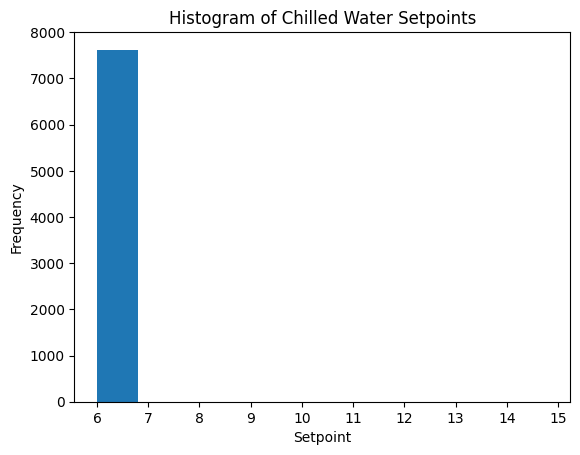

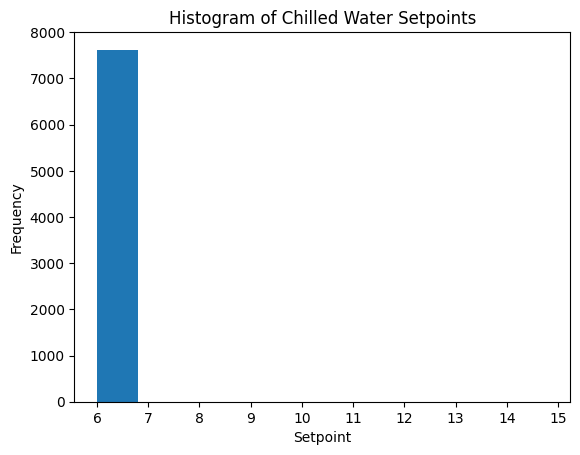

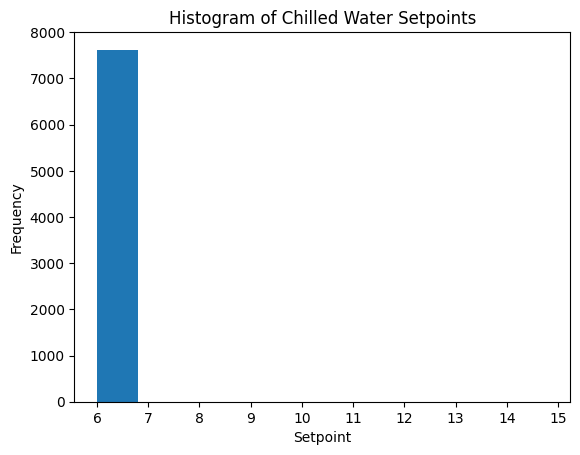

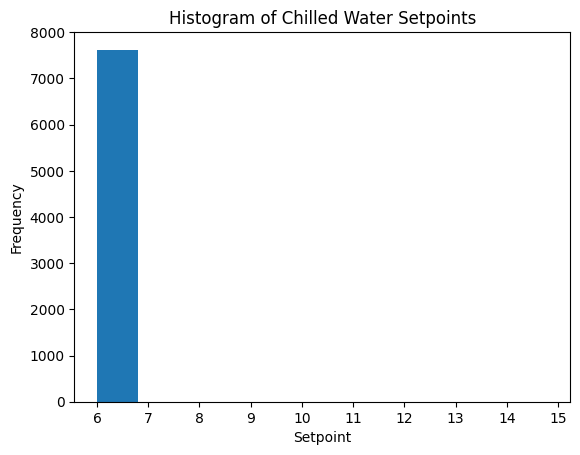

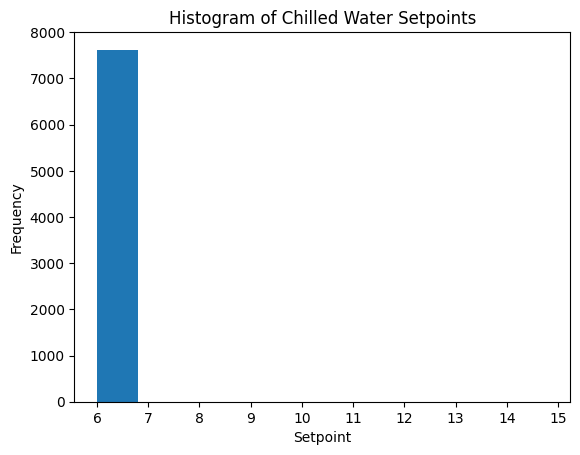

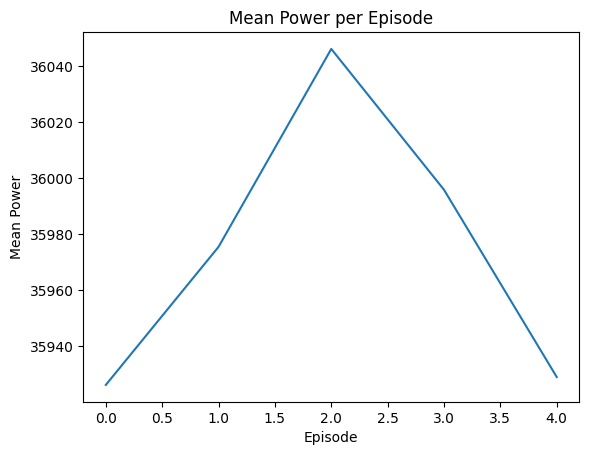

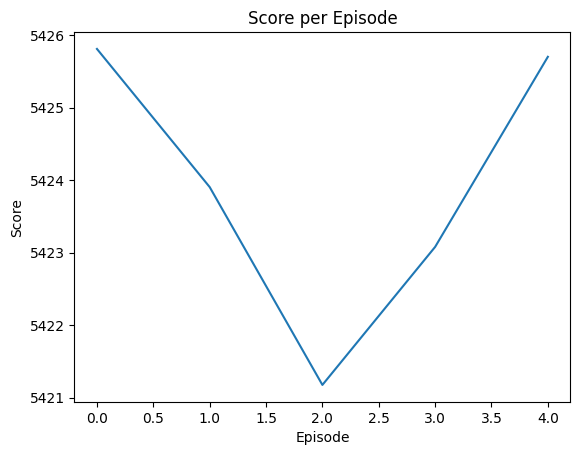

In [3]:
import numpy as np
import matplotlib.pyplot as plt

mean_power_history = []

for episode in range(5):
    mean_power_history.append(np.mean(power_history[episode]))

    '''
    plt.plot(power_history[episode])
    plt.xlabel('Step')
    plt.ylabel('Total Power')
    plt.title('Total Power per Step' + f' (Episode {episode+1})')
    plt.show()
    '''

    counts, bins = np.histogram(setpoints_history[episode], bins=np.arange(6, 16))

    plt.bar(bins[:-1], counts, width=0.8, align='edge')
    plt.xlabel('Setpoint')
    plt.ylabel('Frequency')
    plt.title('Histogram of Chilled Water Setpoints')
    plt.xticks(np.arange(6, 16))
    plt.show()
    

plt.plot(mean_power_history)
plt.xlabel('Episode')
plt.ylabel('Mean Power')
plt.title('Mean Power per Episode')
plt.show()

plt.plot(score_history)
plt.xlabel('Episode')
plt.ylabel('Score')
plt.title('Score per Episode')
plt.show()





